In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pandas_profiling
import plotly.express as px
import plotly.figure_factory as ff
import numpy as np
import seaborn as sns
import tensorflow as tf
# import category_encoders as ce
from sklearn.cluster import KMeans

In [11]:
df = pd.read_csv(r'E:\bachelor project\accident_dataset with gamma.csv')

D:\apps\anaconda\lib\site-packages\IPython\core\interactiveshell.py:3145: DtypeWarning:

Columns (3,7) have mixed types.Specify dtype option on import or set low_memory=False.



In [12]:
df.shape

(89616, 55)

In [13]:
df = df.drop_duplicates()

In [3]:
df=dfs
df.profile_report()

I comment this cell to meet the limitation of github for uploading files. You can run it and see the location of accidents.

In [1]:
# fig = px.scatter_mapbox(lat=df["Start_Lat"], lon=df["Start_Lng"])
# fig.update_layout(mapbox_style="open-street-map")
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.show()

<function matplotlib.pyplot.show(close=None, block=None)>

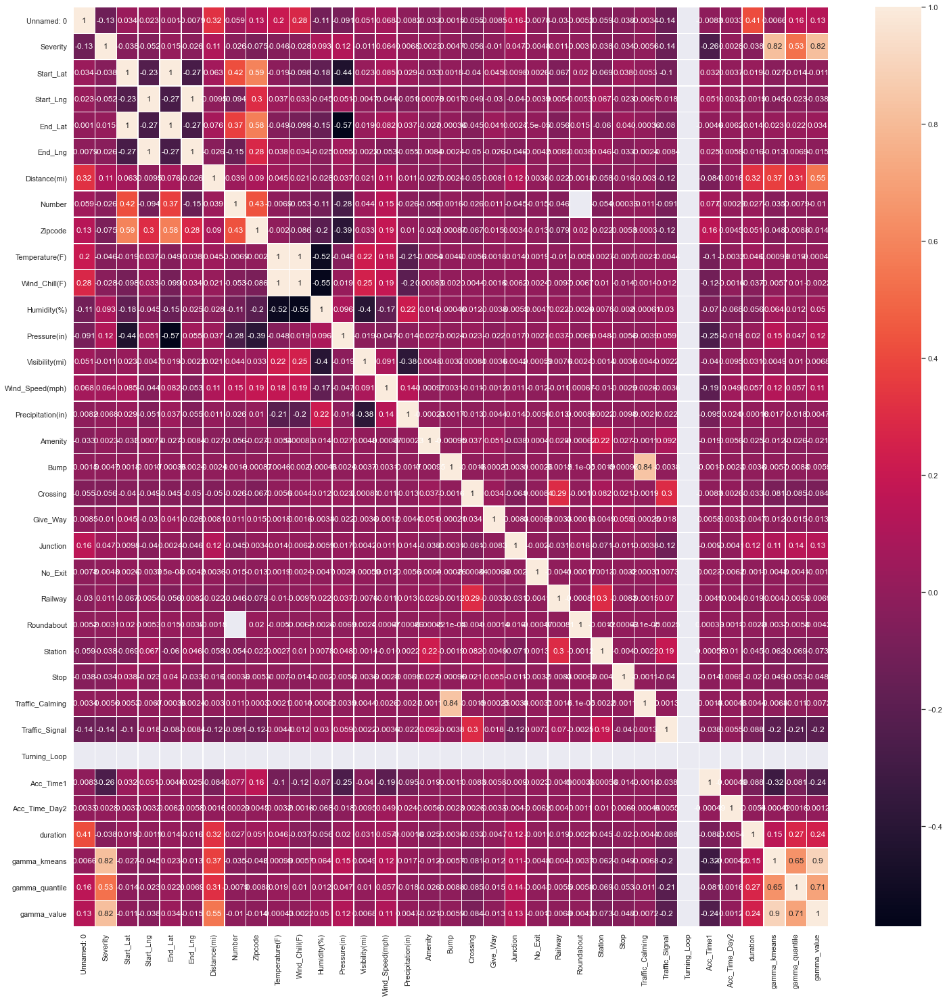

In [8]:
cor=df.corr(method="pearson")
sns.set(rc={'figure.figsize':(25,25)})
sns.heatmap(cor, linewidths=.5,annot=True)
plt.show

In [15]:
df.columns

Index(['Unnamed: 0', 'ID', 'Source', 'TMC', 'Severity', 'Start_Time',
       'End_Time', 'DU', 'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng',
       'Distance(mi)', 'Number', 'Street', 'Side', 'City', 'County', 'State',
       'Zipcode', 'Timezone', 'Airport_Code', 'Weather_Timestamp',
       'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
       'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight', 'Acc_Time1', 'duration', 'geohash_code5',
       'gamma_kmeans', 'gamma_quantile', 'gamma_value'],
      dtype='object')

In [16]:
df.drop(['Unnamed: 0', "Source",'Start_Time', 'End_Time',  "ID", "TMC",'Start_Lat', 'Start_Lng', "Nautical_Twilight", "Astronomical_Twilight", 'DU',
         "Civil_Twilight", "End_Lat","End_Lng", "County", "State", 'Street', "Number",'Zipcode', 'Timezone', "Airport_Code", "Weather_Timestamp",
         'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)',
          'Wind_Direction', 'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition'],axis=1,inplace=True)

In [17]:
df["Sunrise_Sunset"]=df["Sunrise_Sunset"].map(lambda x:1.0 if x=="Day" else 0.0)
df["Side"]=df["Side"].map(lambda x:1.0 if x=="R" else 0.0)

In [19]:
df["City"]=df["City"].fillna(df["City"].mode().iloc[0])

In [22]:
df.head(3)

,Severity,Distance(mi),Side,City,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,...,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Acc_Time1,duration,geohash_code5,gamma_kmeans,gamma_quantile,gamma_value
0,3.0,0.01,1.0,Los Angeles,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2016032210,95,9q5cq,2,2,1.074274
1,2.0,0.00,0.0,Los Angeles,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2016032211,45,9q5cw,1,1,-0.542764
2,3.0,0.01,1.0,Los Angeles,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2016032211,61,9q5c9,2,2,0.860566


In [23]:
df['time']= df['Acc_Time1']
df['geo'] = df['geohash_code5']

In [24]:
df.drop(['Side', 'City', 'Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction',
        'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
        'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',],axis=1,inplace=True)

In [41]:
dff=df.groupby(["geohash_code5", 'Acc_Time1']).agg({"duration":"sum",
                                                       "Distance(mi)":"sum","Severity":"sum", 'time':"mean", 'geo': "first",
                                                    'gamma_kmeans': 'first', 'gamma_quantile': 'first', 'gamma_value':'first' })

# time interval which is used to study in our project

In [43]:
index = pd.read_excel(r'E:\bachelor project/index.xlsx')

In [44]:
dff.columns

Index(['duration', 'Distance(mi)', 'Severity', 'time', 'geo', 'gamma_kmeans',
       'gamma_quantile', 'gamma_value'],
      dtype='object')

In [45]:
acc = pd.merge(left=index, right=dff, how='left', left_on=["time_index", "geohash"], right_on=['time',"geo"], copy = False)

In [46]:
acc.shape

(910000, 10)

In [47]:
acc

,time_index,geohash,duration,Distance(mi),Severity,time,geo,gamma_kmeans,gamma_quantile,gamma_value
0,2018050201,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018050202,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2018050203,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2018050204,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2018050205,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
909995,2019101604,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
909996,2019101605,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
909997,2019101606,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
909998,2019101607,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# add Road Network attributes

In [48]:
acc.drop(['geo','time'],axis=1,inplace=True)

In [49]:
acc

,time_index,geohash,duration,Distance(mi),Severity,gamma_kmeans,gamma_quantile,gamma_value
0,2018050201,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN
1,2018050202,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN
2,2018050203,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN
3,2018050204,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN
4,2018050205,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
909995,2019101604,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN
909996,2019101605,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN
909997,2019101606,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN
909998,2019101607,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
poi = pd.read_csv(r'E:\bachelor project/geohash_to_poi_vec.csv')

In [51]:
accident_dataset = pd.merge(left=acc, right=poi, how='left', left_on=["geohash"], right_on=["Geohash"])

In [52]:
accident_dataset.to_csv(r'E:\bachelor project/final_accident_dataset + poi.csv')

In [53]:
accident_dataset = pd.read_csv(r'E:\bachelor project/final_accident_dataset + poi.csv')

# adding weather

In [54]:
dc1= pd.read_excel(r'E:\bachelor project\bachelorweather for 2018-2019- 12parts.xlsx', sheet_name='index12_1' )
dc2= pd.read_excel(r'E:\bachelor project\bachelorweather for 2018-2019- 12parts.xlsx', sheet_name='index12_2' )

In [131]:
weather = dc1.append(dc2, ignore_index=True)

In [132]:
weather.shape

(1339200, 16)

In [133]:
weather['Conditions'].unique()

array(['Partly Cloudy', 'Mostly Cloudy', 'Haze', 'Overcast', 'Fog', nan,
       'Light Rain', 'Heavy Rain', 'Clear', 'Mist', 'Smoke', 'Cloudy',
       'Fair', 'Thunder', '[]', 'Unknown'], dtype=object)

In [134]:
t = weather[weather['Conditions']=='[]']
p = weather[weather['Conditions']!='[]']
t['Conditions'] = 'Fair'
weather = t.append(p, ignore_index=True)

weather['Conditions'] = weather['Conditions'].replace(to_replace=['Unknown'], value='Fair', regex=True)
weather['Conditions'] = weather['Conditions'].fillna('Fair')

In [135]:
weather.drop([ 'lat', 'lon', 'AP', 'time'],axis=1,inplace=True)

In [136]:
weather.head(3)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,twelve,geohash,Temp,Humd,Pressure,Visib,WindSpeed,Conditions,WindDir
0,597214,7966,7966,2019101311,9q5cv,60.5,82.0,29.055,10.0,3.0,Fair,E
1,606142,16894,79390,2019101311,9q5f4,60.5,82.0,29.055,10.0,3.0,Fair,E
2,615070,25822,141886,2019101311,9q5fm,60.5,82.0,29.055,10.0,3.0,Fair,E


In [137]:
weather.drop(['Unnamed: 0', 'Unnamed: 0.1','Unnamed: 0.1.1', 'Temp', 'Humd', 'Pressure', 'Visib', 'WindSpeed', 'WindDir'],axis=1,inplace=True)
# weather.drop(['Conditions'],axis=1,inplace=True)

In [138]:
weather.shape

(1339200, 3)

In [139]:
weather.head()

,twelve,geohash,Conditions
0,2019101311,9q5cv,Fair
1,2019101311,9q5f4,Fair
2,2019101311,9q5fm,Fair
3,2019101311,9q5cg,Fair
4,2019101311,9q5fh,Fair


In [157]:
acc_final = pd.merge(left=accident_dataset, right=weather, how='left', left_on=['time_index',"Geohash"], right_on=['twelve', "geohash"])

In [158]:
# Get one hot encoding of columns B
one_hot = pd.get_dummies(acc_final["Conditions"])
# Join the encoded df
acc_final = acc_final.join(one_hot)
# Drop column Conditions_code as it is now encoded
acc_final = acc_final.drop(['Conditions'],axis = 1)

In [159]:
acc_final = acc_final.drop('twelve',axis = 1)

In [160]:
acc_final

,Unnamed: 0,time_index,geohash_x,duration,Distance(mi),Severity,gamma_kmeans,gamma_quantile,gamma_value,Geohash,...,Fair,Fog,Haze,Heavy Rain,Light Rain,Mist,Mostly Cloudy,Overcast,Partly Cloudy,Smoke
0,0,2018050201,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
1,1,2018050202,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
2,2,2018050203,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3,3,2018050204,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
4,4,2018050205,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
909995,909995,2019101604,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,9qhh2,...,1,0,0,0,0,0,0,0,0,0
909996,909996,2019101605,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,9qhh2,...,1,0,0,0,0,0,0,0,0,0
909997,909997,2019101606,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,9qhh2,...,1,0,0,0,0,0,0,0,0,0
909998,909998,2019101607,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,9qhh2,...,0,0,0,0,0,0,0,0,0,0


In [161]:
acc_final.drop(['Unnamed: 0', 'Geohash', 'geohash_y'],axis=1,inplace=True)

In [162]:
acc_final["geohash_x"] = acc_final["geohash_x"].astype('category')
acc_final["geohash_code"] = acc_final["geohash_x"].cat.codes

In [163]:
acc_final.to_csv(r'E:\bachelor project\final_accident_dataset+weather+poi.csv')

In [164]:
acc_final.columns

Index(['time_index', 'geohash_x', 'duration', 'Distance(mi)', 'Severity',
       'gamma_kmeans', 'gamma_quantile', 'gamma_value', 'Amenity', 'Bump',
       'Crossing', 'Entrance', 'Give_Way', 'Junction', 'Noexit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Circle', 'Turning_Loop', 'Clear', 'Cloudy', 'Fair', 'Fog',
       'Haze', 'Heavy Rain', 'Light Rain', 'Mist', 'Mostly Cloudy', 'Overcast',
       'Partly Cloudy', 'Smoke', 'geohash_code'],
      dtype='object')

# # we add binary weekend/weekday feature using excel function

# continue

In [174]:
df = pd.read_csv(r'E:\bachelor project/final_accident_dataset+weather+poi.csv')

In [175]:
df

,time_index,geohash_x,acc_count_y,duration_y,Distance(mi),Severity_y,gamma_kmeans_y,gamma_quantile_y,gamma_value_y,Amenity,...,Heavy Rain,Light Rain,Mist,Mostly Cloudy,Overcast,Partly Cloudy,Smoke,geohash_code,cng_count,weekend
0,2018050201,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70,...,0,0,0,1,0,0,0,0,NaN,0
1,2018050202,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70,...,0,0,0,1,0,0,0,0,NaN,0
2,2018050203,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70,...,0,0,0,1,0,0,0,0,NaN,0
3,2018050204,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70,...,0,0,0,1,0,0,0,0,NaN,0
4,2018050205,9mgzu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70,...,0,0,0,1,0,0,0,0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
909995,2019101604,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,139,NaN,0
909996,2019101605,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,139,NaN,0
909997,2019101606,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,139,NaN,0
909998,2019101607,9qhh2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,139,NaN,0


In [176]:
#save the columns that we don't want to be changed
time_index = df['time_index']
geohash_x = df['geohash_x']
df['geohash_x']=0
kmeans = df['gamma_kmeans_y']
quantile = df['gamma_quantile_y']
value = df['gamma_value_y']

In [177]:
columns = df.columns

In [178]:
#Normalization
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler() 
scaled_values = scaler.fit_transform(df) 
df.loc[:,:] = scaled_values

In [181]:
df = df.fillna(0)
df

,time_index,geohash_x,acc_count_y,duration_y,Distance(mi),Severity_y,gamma_kmeans_y,gamma_quantile_y,gamma_value_y,Amenity,...,Heavy Rain,Light Rain,Mist,Mostly Cloudy,Overcast,Partly Cloudy,Smoke,geohash_code,cng_count,weekend
0,2018050201,9mgzu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.114379,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2018050202,9mgzu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.114379,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2018050203,9mgzu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.114379,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2018050204,9mgzu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.114379,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2018050205,9mgzu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.114379,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
909995,2019101604,9qhh2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
909996,2019101605,9qhh2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
909997,2019101606,9qhh2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
909998,2019101607,9qhh2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [180]:
df['time_index'] = time_index 
df['geohash_x'] = geohash_x 
df['gamma_kmeans_y'] = kmeans 
df['gamma_quantile_y'] = quantile
df['gamma_value_y'] = value 

In [182]:
df.to_csv(r'E:\bachelor project\normalized_2classes.csv')